# EDA - Gemstone Price Prediction

- Problem Statement:

    You are hired by a company Gem Stones co ltd, which is a cubic zirconia manufacturer. You are provided with the dataset containing the prices and other attributes of almost 27,000 cubic zirconia (which is an inexpensive diamond alternative with many of the same qualities as a diamond). The company is earning different profits on different prize slots. You have to help the company in predicting the price for the stone on the basis of the details given in the dataset so it can distinguish between higher profitable stones and lower profitable stones so as to have a better profit share. Also, provide them with the best 5 attributes that are most important.

## Libraries and Packages

In [1]:
# data processing
import pandas as pd
import numpy as np

# data transformation
from sklearn.preprocessing import QuantileTransformer

# statistics
import scipy.stats as stats

# data visualization
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
import seaborn as sns

# os
import os
from os.path import join

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [2]:
os.getcwd() # current directory

'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset\\notebooks'

## Setting paths

In [3]:
root_dir = r'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset' # set rot dir to project dir
os.chdir(root_dir)
os.getcwd()

'C:\\Users\\ivan_\\Desktop\\projects\\playground_series_gemstone_price_dataset'

In [4]:
# Data paths
os.listdir(join(root_dir,"data"))

['.gitignore',
 'data_dictionary.xlsx',
 'sample_submission.csv',
 'submissions',
 'test.csv',
 'test.csv.dvc',
 'train.csv',
 'train.csv.dvc']

In [5]:
data_train_path = join(root_dir,"data","train.csv")
data_test_path = join(root_dir,"data","test.csv")
data_dict_path = join(root_dir,"data","data_dictionary.xlsx")

## Descriptive Description

In [6]:
df_train = pd.read_csv(data_train_path)
df_test = pd.read_csv(data_test_path)
data_dict = pd.read_excel(data_dict_path)

In [7]:
df_train.head()

,id,carat,cut,color,clarity,depth,table,x,y,z,price
0,0,1.52,Premium,F,VS2,62.2,58.0,7.27,7.33,4.55,13619
1,1,2.03,Very Good,J,SI2,62.0,58.0,8.06,8.12,5.05,13387
2,2,0.70,Ideal,G,VS1,61.2,57.0,5.69,5.73,3.50,2772
3,3,0.32,Ideal,G,VS1,61.6,56.0,4.38,4.41,2.71,666
4,4,1.70,Premium,G,VS2,62.6,59.0,7.65,7.61,4.77,14453


In [8]:
df_test.head()

,id,carat,cut,color,clarity,depth,table,x,y,z
0,193573,0.35,Ideal,D,VS2,62.3,56.0,4.51,4.54,2.82
1,193574,0.77,Very Good,F,SI2,62.8,56.0,5.83,5.87,3.68
2,193575,0.71,Ideal,I,VS2,61.9,53.0,5.77,5.74,3.55
3,193576,0.33,Ideal,G,VVS2,61.6,55.0,4.44,4.42,2.73
4,193577,1.20,Very Good,I,VS2,62.7,56.0,6.75,6.79,4.24


In [9]:
data_dict

,Variable Name,Description
0,Carat,Carat weight of the cubic zirconia.
1,Cut,"Describe the cut quality of the cubic zirconia. Quality is increasing order Fair, Good, Very Good, Premium, Ideal."
2,Color,Colour of the cubic zirconia.With D being the best and J the worst.
3,Clarity,"cubic zirconia Clarity refers to the absence of the Inclusions and Blemishes. (In order from Best to Worst, FL = flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3"
4,Depth,"The Height of a cubic zirconia, measured from the Culet to the table, divided by its average Girdle Diameter."
5,Table,The Width of the cubic zirconia's Table expressed as a Percentage of its Average Diameter.
6,Price,the Price of the cubic zirconia.
7,X,Length of the cubic zirconia in mm.
8,Y,Width of the cubic zirconia in mm.
9,Z,Height of the cubic zirconia in mm.


In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193573 entries, 0 to 193572
Data columns (total 11 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       193573 non-null  int64  
 1   carat    193573 non-null  float64
 2   cut      193573 non-null  object 
 3   color    193573 non-null  object 
 4   clarity  193573 non-null  object 
 5   depth    193573 non-null  float64
 6   table    193573 non-null  float64
 7   x        193573 non-null  float64
 8   y        193573 non-null  float64
 9   z        193573 non-null  float64
 10  price    193573 non-null  int64  
dtypes: float64(6), int64(2), object(3)
memory usage: 16.2+ MB


In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129050 entries, 0 to 129049
Data columns (total 10 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       129050 non-null  int64  
 1   carat    129050 non-null  float64
 2   cut      129050 non-null  object 
 3   color    129050 non-null  object 
 4   clarity  129050 non-null  object 
 5   depth    129050 non-null  float64
 6   table    129050 non-null  float64
 7   x        129050 non-null  float64
 8   y        129050 non-null  float64
 9   z        129050 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 9.8+ MB


In [12]:
# null values
df_train.isna().sum().sum(), df_test.isna().sum().sum() # There are not null values in this dataset

(0, 0)

## Data Visualization

In [13]:
# Get columns base in dtypes
float_cols = df_train.drop("price", axis = "columns").select_dtypes(include = "float").columns.to_list()
object_cols = df_train.drop("price", axis = "columns").select_dtypes(include = "object").columns.to_list()

### Price Distribution

In [14]:
%matplotlib inline

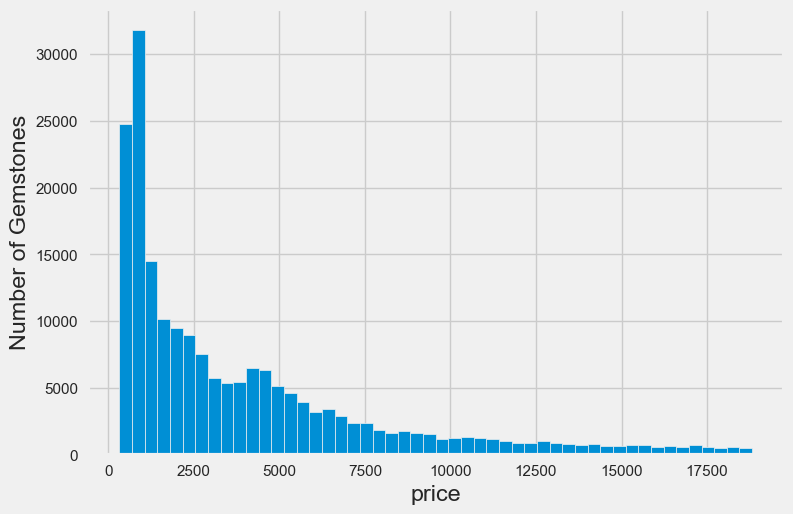

In [15]:
df_train["price"].hist(bins = 50)
plt.ylabel("Number of Gemstones")
plt.xlabel("price")
plt.show()

In [16]:
df_train["price"].describe()

count    193573.000000
mean       3969.155414
std        4034.374138
min         326.000000
25%         951.000000
50%        2401.000000
75%        5408.000000
max       18818.000000
Name: price, dtype: float64

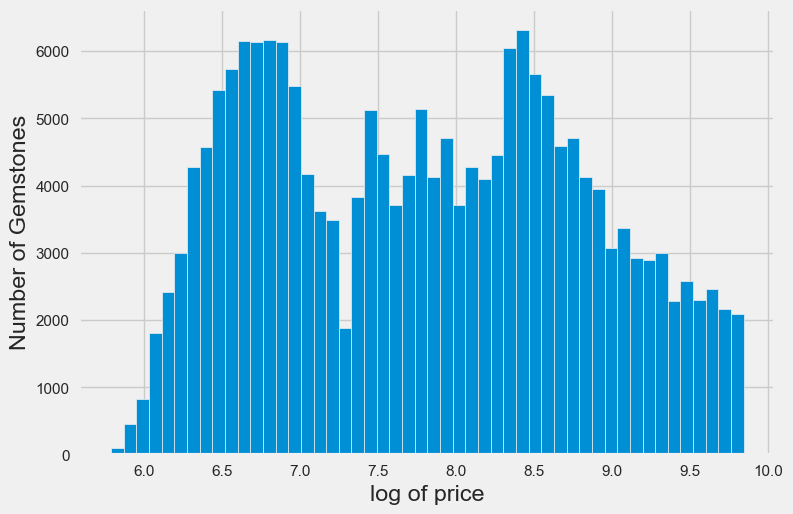

In [17]:
# Log transformation
np.log(df_train["price"]).hist(bins = 50)
plt.ylabel("Number of Gemstones")
plt.xlabel("log of price")
plt.show()

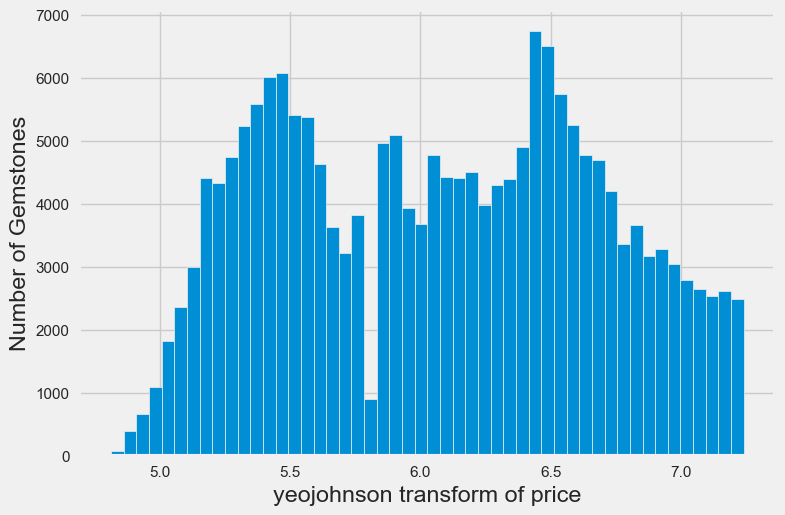

In [18]:
price_transform, param = stats.yeojohnson(df_train["price"])
pd.Series(price_transform).hist(bins = 50)
plt.ylabel("Number of Gemstones")
plt.xlabel("yeojohnson transform of price")
plt.show()

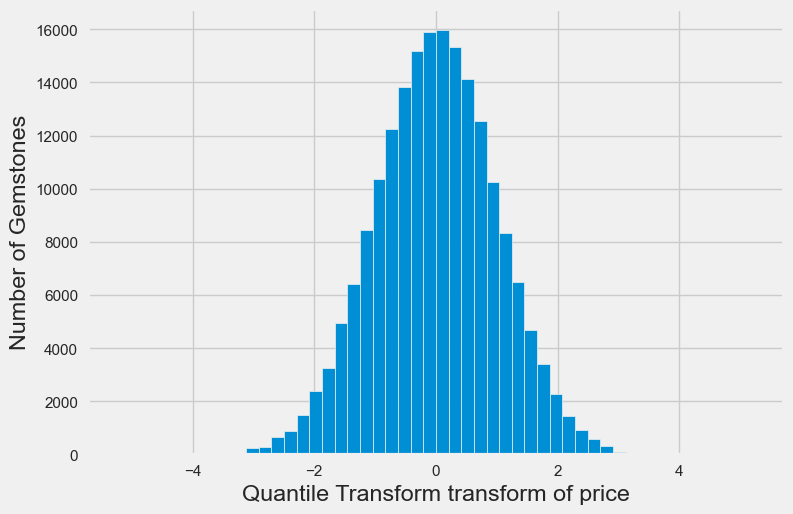

In [19]:
# pd.Series(bc.inverse_transform(price_transform[:,None])[:,0]) # --> Back projection to the original space
bc = QuantileTransformer(n_quantiles=500, output_distribution="normal",random_state=np.random.RandomState(745))
price_transform = bc.fit_transform(df_train["price"].values[:,None])[:,0]
pd.Series(price_transform).hist(bins = 50)
plt.ylabel("Number of Gemstones")
plt.xlabel("Quantile Transform transform of price")
plt.show()

### Numeric Features vs price

In [20]:
AV = AutoViz_Class()

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
x,465,float64,0,0.000000,4.650000,0,
y,462,float64,0,0.000000,4.620000,0,
z,302,float64,0,0.000000,3.020000,0,
carat,195,float64,0,0.000000,1.950000,0,
depth,102,float64,0,0.000000,1.020000,0,
table,50,float64,0,0.000000,0.500000,0,


    6 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


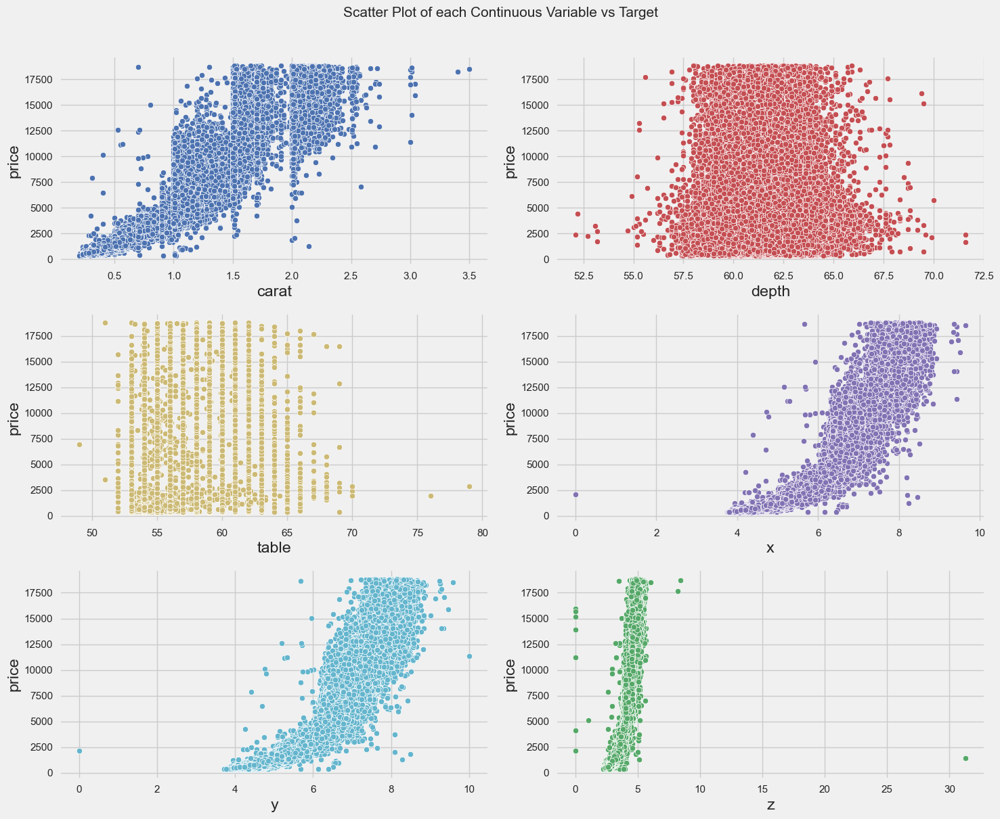

Number of All Scatter Plots = 21


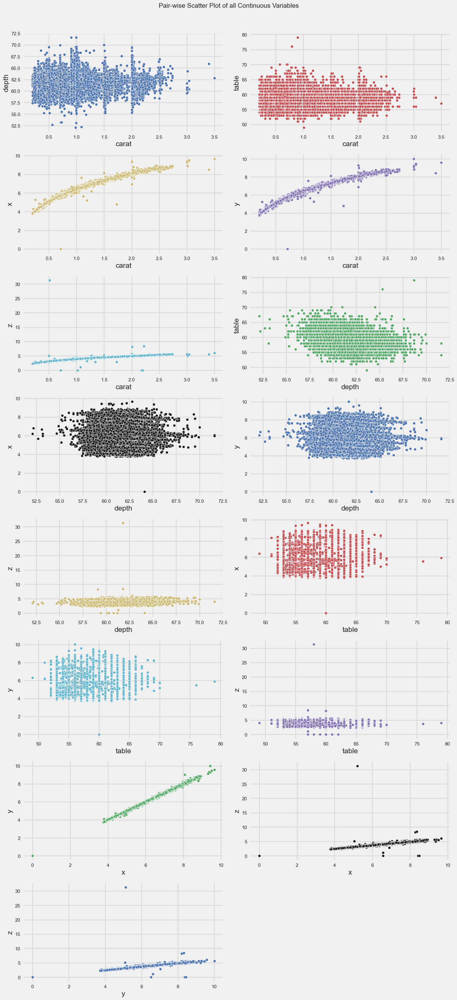

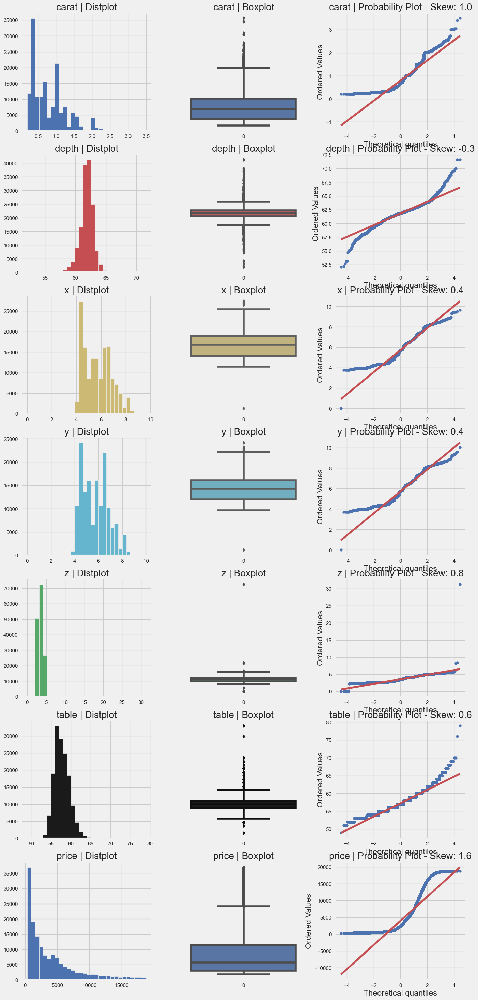

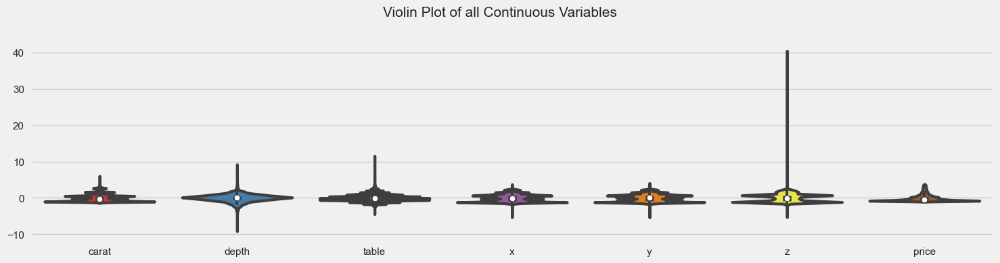

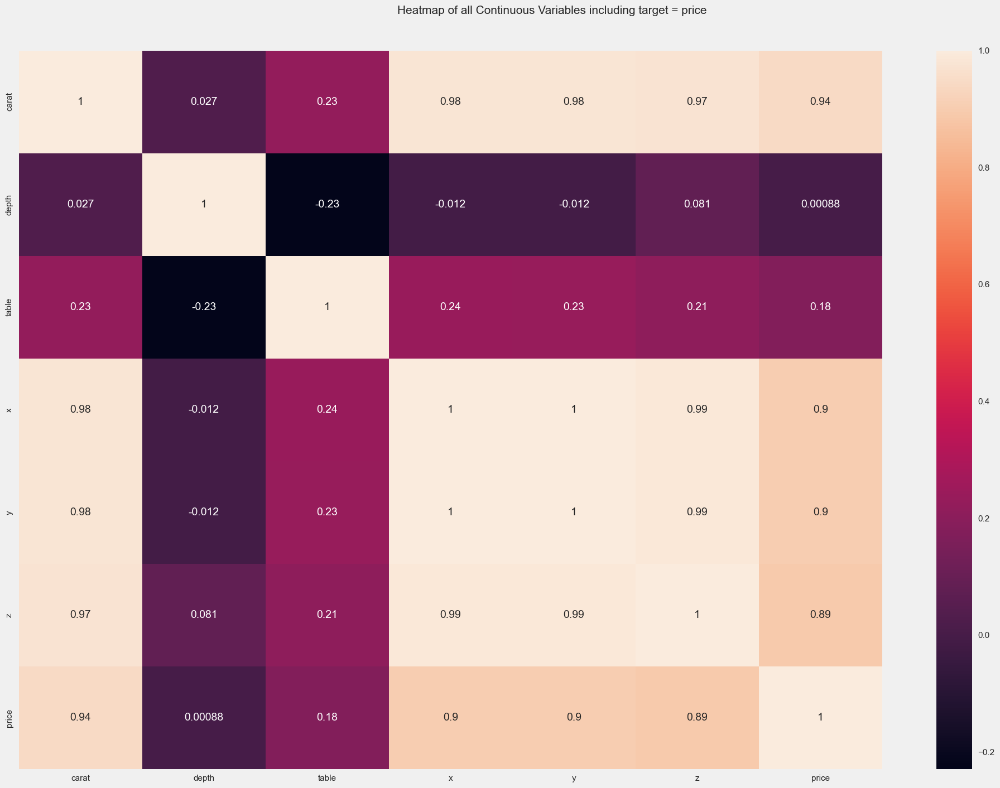

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 17 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [21]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = df_train[float_cols + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

In [22]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price",
    dfte = df_train[object_cols + ["price"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 4)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
clarity,8,object,0,0.000000,0.080000,37,
color,7,object,0,0.000000,0.070000,343,
cut,5,object,0,0.000000,0.050000,97,


    3 Predictors classified...
Cannot visualize this dataset since no numeric or integer vars in data...returning
Not able to read or load file. Please check your inputs and try again...


### Numeric Features vs quantile Price Visualization

In [23]:
df_train["price_quantile_transform"] = price_transform

    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
x,465,float64,0,0.000000,4.650000,0,
y,462,float64,0,0.000000,4.620000,0,
z,302,float64,0,0.000000,3.020000,0,
carat,195,float64,0,0.000000,1.950000,0,
depth,102,float64,0,0.000000,1.020000,0,
table,50,float64,0,0.000000,0.500000,0,


    6 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################


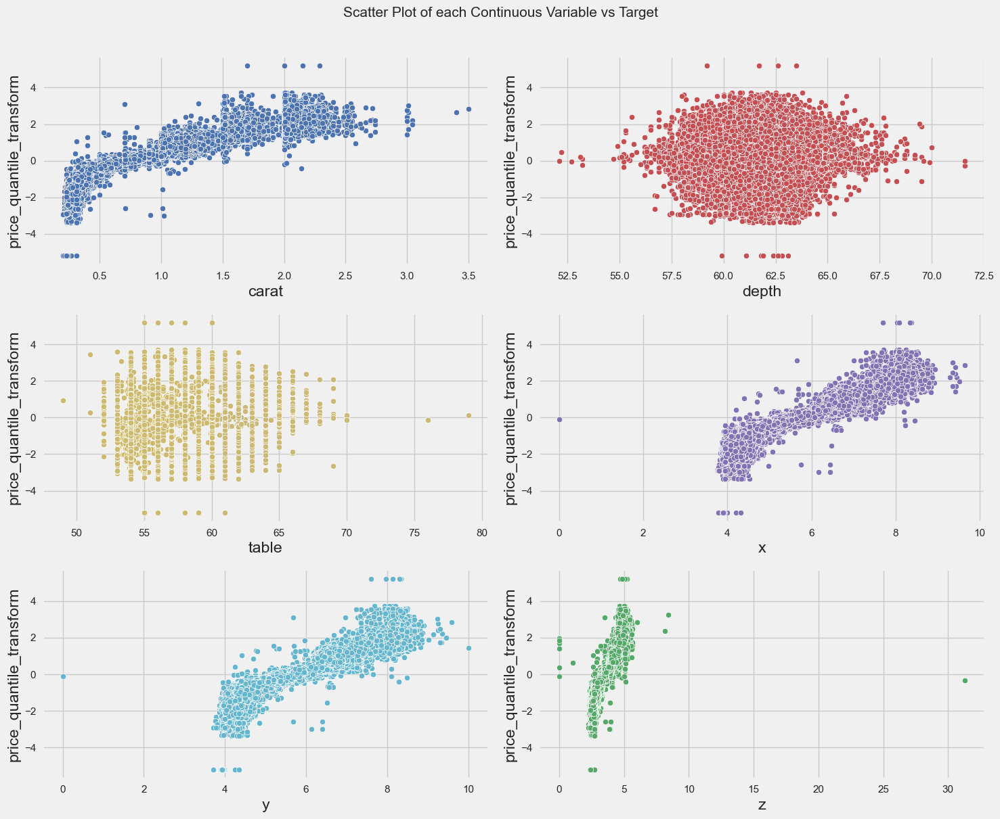

Number of All Scatter Plots = 21


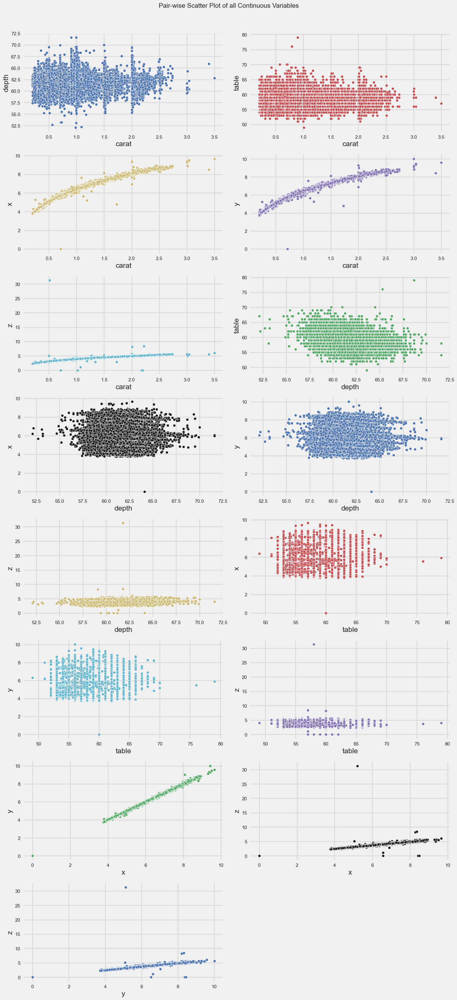

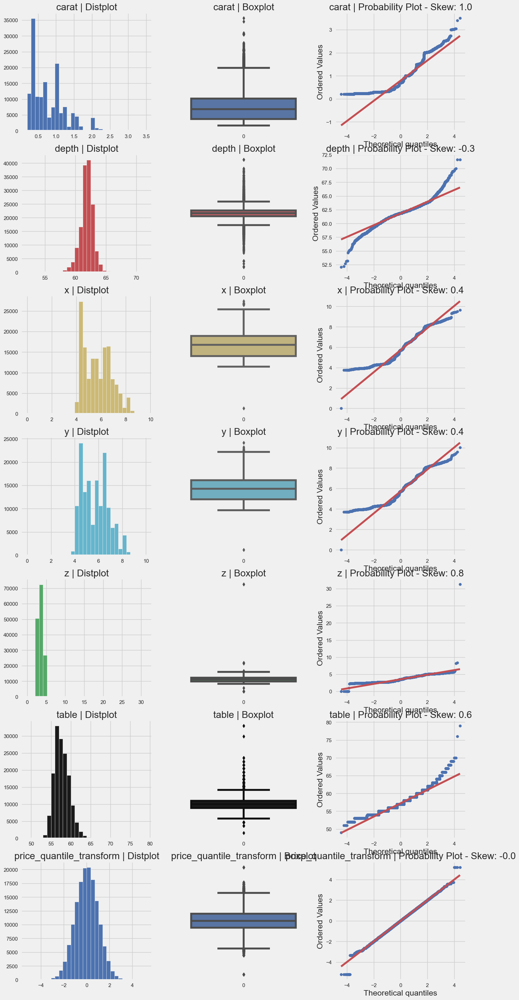

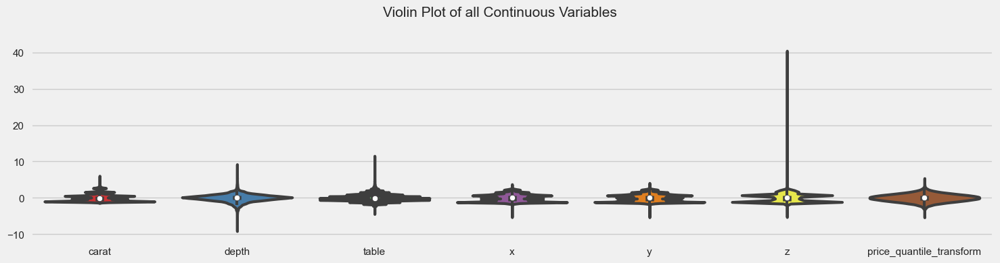

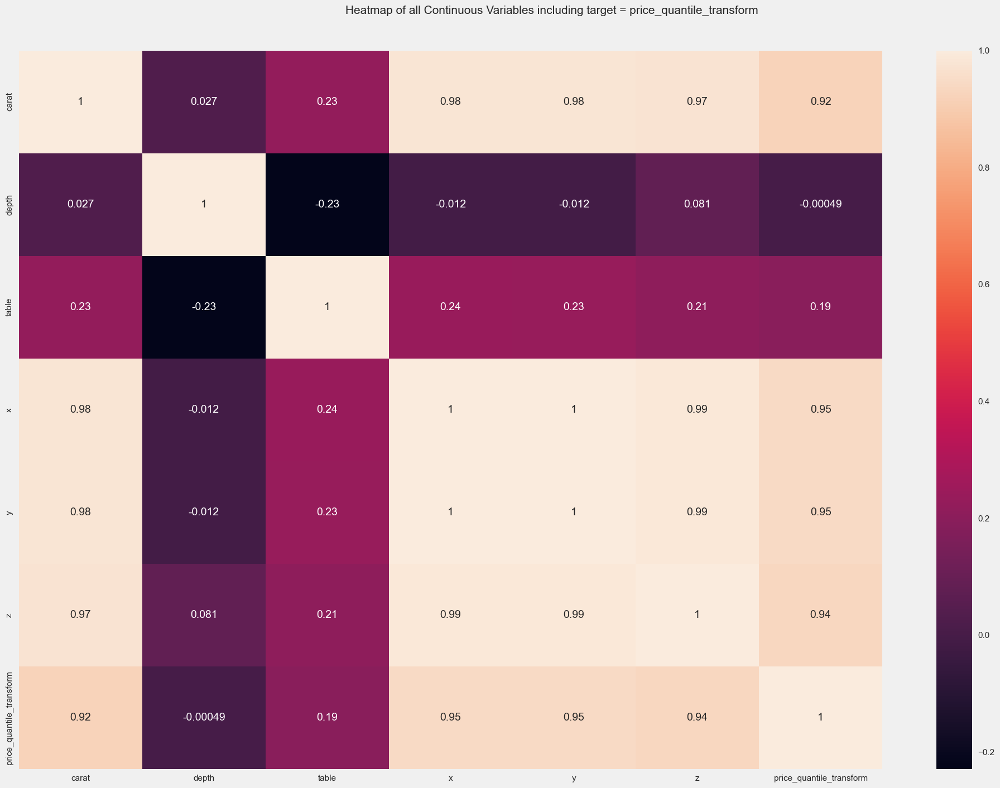

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 17 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [24]:
%matplotlib inline
_ = AV.AutoViz(
    "",
    depVar = "price_quantile_transform",
    dfte = df_train[float_cols + ["price_quantile_transform"]],
    verbose = 1,
    lowess=False,
    chart_format="svg"
)

### Discrete Variables

In [25]:
df_train[object_cols].head()

,cut,color,clarity
0,Premium,F,VS2
1,Very Good,J,SI2
2,Ideal,G,VS1
3,Ideal,G,VS1
4,Premium,G,VS2


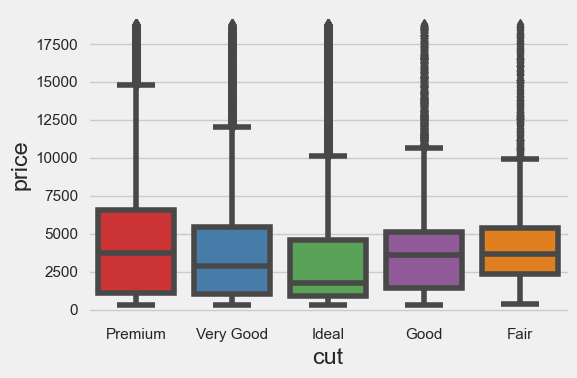

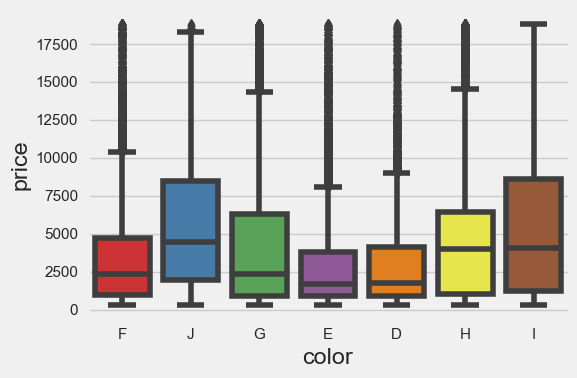

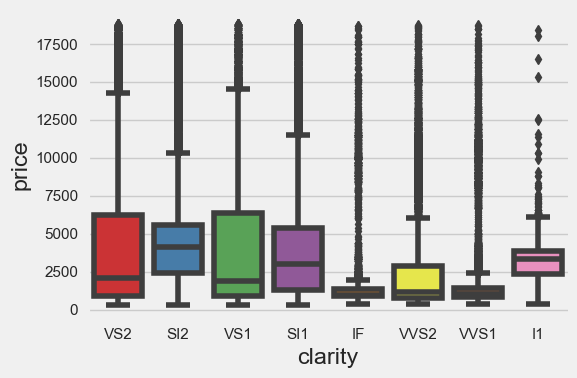

In [26]:
for var in object_cols:
    sns.catplot(x = var, y = "price", data = df_train, kind = "box", height = 4, aspect = 1.5)
    plt.show()

### Continous Variables

In [27]:
df_train[float_cols].head()

,carat,depth,table,x,y,z
0,1.52,62.2,58.0,7.27,7.33,4.55
1,2.03,62.0,58.0,8.06,8.12,5.05
2,0.70,61.2,57.0,5.69,5.73,3.50
3,0.32,61.6,56.0,4.38,4.41,2.71
4,1.70,62.6,59.0,7.65,7.61,4.77


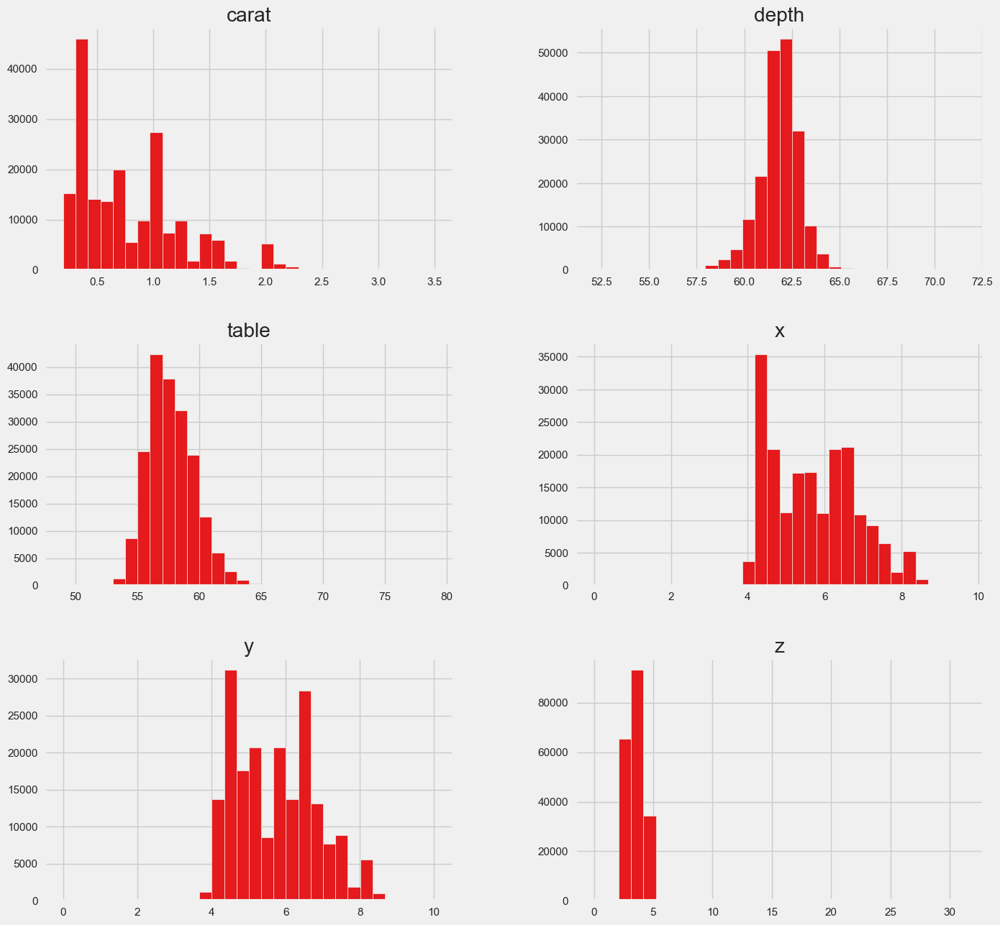

In [28]:
# lets plot histograms for all continuous variables
df_train[float_cols].hist(bins = 30, figsize = (15,15))
plt.show()

In [29]:
# capture the continuous variables that we wnat to tranksform

to_transform_vars = [
    'carat',
    'x',
    'y',
    'z'
]

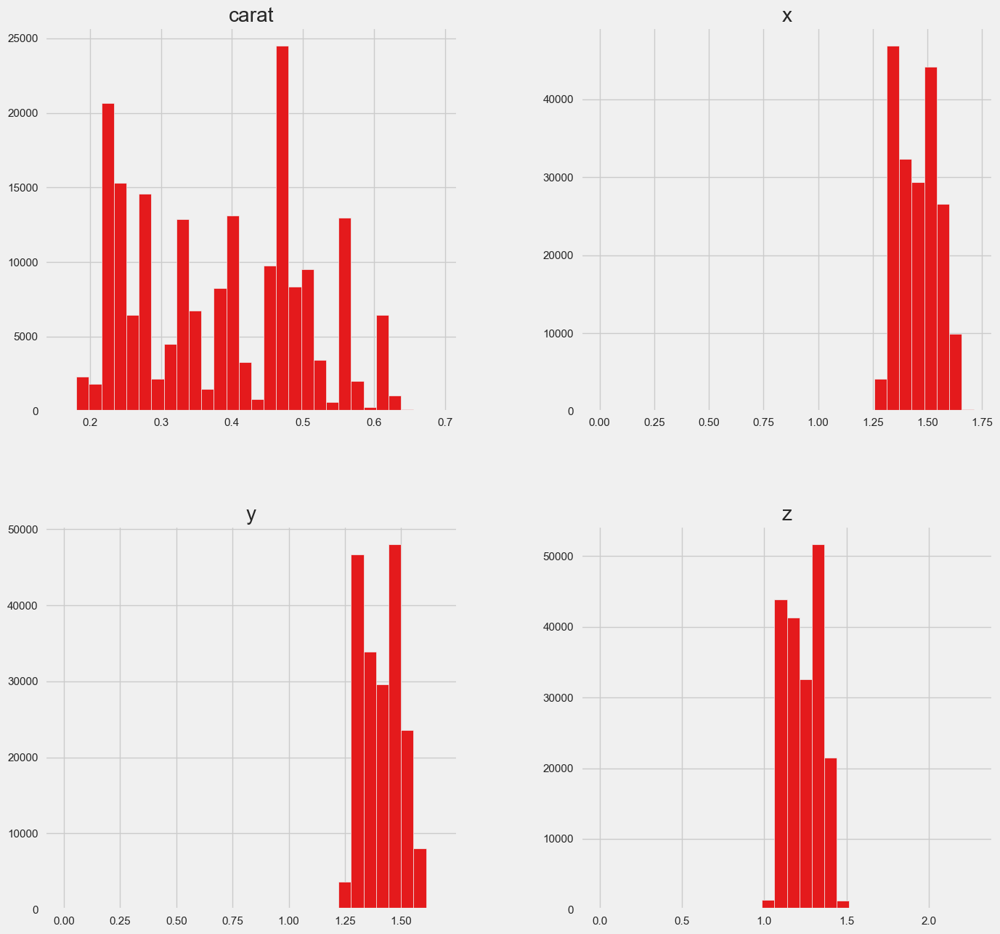

In [30]:
# Let's go ahead and analyse the distributions of the variables
# after applying a yeo-johnson transformation

# temporary copy of the data
tmp = df_train.copy()

for var in to_transform_vars:

    # transform the variable - yeo-johsnon
    tmp[var], param = stats.yeojohnson(df_train[var])

    
# plot the histograms of the transformed variables
tmp[to_transform_vars].hist(bins=30, figsize=(15,15))
plt.show()

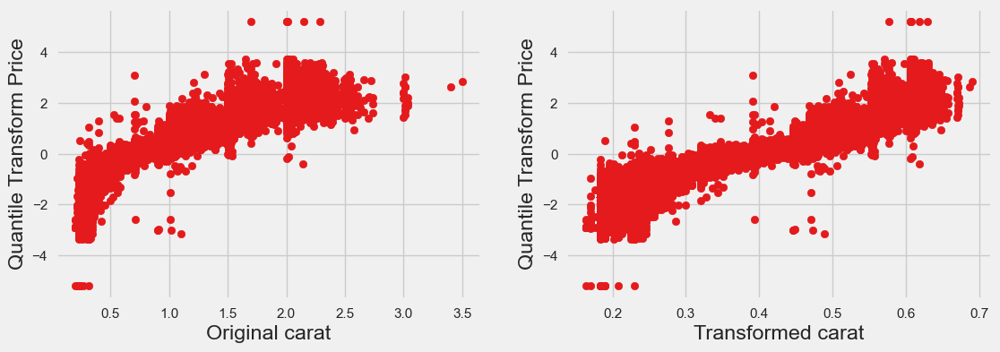

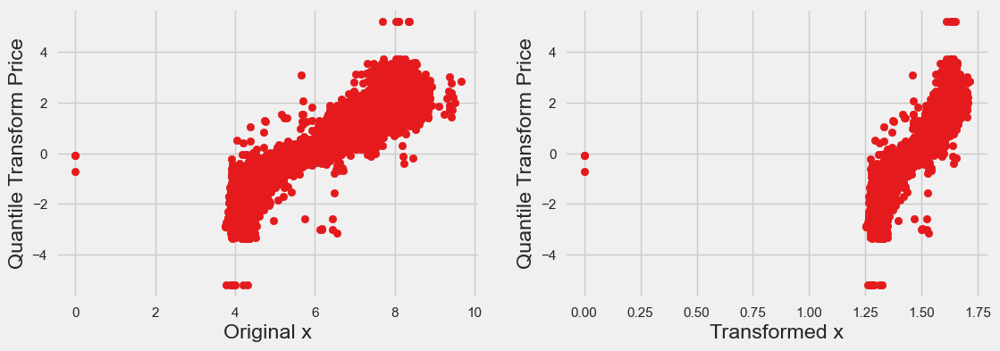

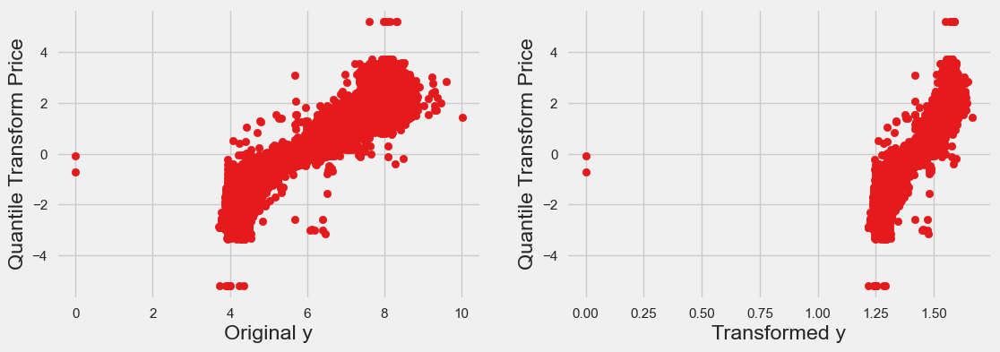

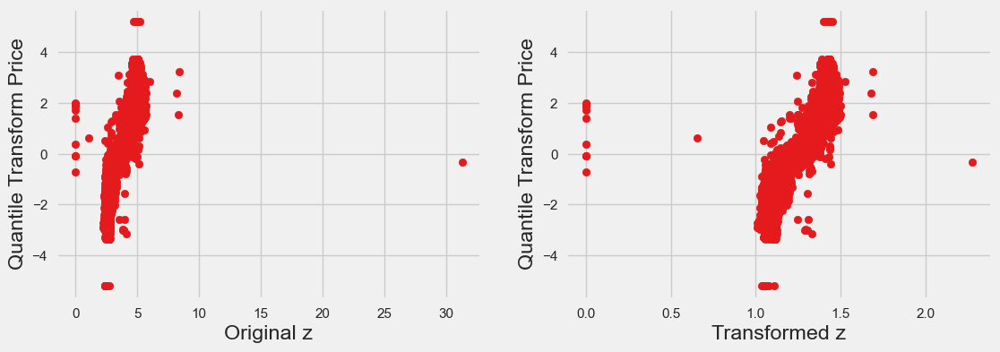

In [31]:
# let's plot the original or transformed variables
# vs sale price, and see if there is a relationship

for var in to_transform_vars:
    
    plt.figure(figsize=(12,4))
    
    # plot the original variable vs sale price    
    plt.subplot(1, 2, 1)
    plt.scatter(df_train[var], df_train['price_quantile_transform'])
    plt.ylabel('Quantile Transform Price')
    plt.xlabel('Original ' + var)

    # plot transformed variable vs sale price
    plt.subplot(1, 2, 2)
    plt.scatter(tmp[var], tmp['price_quantile_transform'])
    plt.ylabel('Quantile Transform Price')
    plt.xlabel('Transformed ' + var)
                
    plt.show()

### Rare Labels

In [32]:
def analyse_rare_labels(df, var, rare_perc):
    df = df.copy()

    # determine the % of observations per category
    tmp = df.groupby(var)['price'].count() / len(df)

    # return categories that are rare
    return tmp[tmp < rare_perc]

# print categories that are present in less than
# 1 % of the observations
for var in object_cols:
    print(analyse_rare_labels(df_train, var, 0.01))
    print()

Series([], Name: price, dtype: float64)

Series([], Name: price, dtype: float64)

clarity
I1    0.002645
Name: price, dtype: float64

